# Problem Statement

iPrint, an upcoming Indian media house that offers media and information services to the people, has decided to begin providing a more personalised experience to its customers. The company’s business extends across a wide range of media, including news and information services on sports, weather, education, health, research, stocks and healthcare.

iPrint has been managing its customer base by only recommending the most popular and similar news articles to its users. However, the recommended news articles are often not relevant to the majority of the users. And the company is not able to recommend any new content to its customers, and gradually, the company sthas started to lose such users, resulting in immense revenue loss.

In order to stay healthy in the market, iPrint needs to stay updated with time an technology advancements.


# Suggestion

A probable solution for the company to compete with other competitors is to solve the issue of revenue leakage by personalising users' tastes and introducing new content to its users at the start of the day on the home page of the application.


# Solution

##### Building a NEWS RECOMMENDATION SYSTEM that does below:

--> Recommend new top 10 relevant articles to a user when he/she visits the app at the start of the day

--> Recommend top 10 similar news articles that match the ones clicked by the user.

The articles that are written in the English language must be considered.

## 1. Data Pre-Processing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 5000)

In [3]:
consumer_ds = pd.read_csv('data/consumer_transanctions.csv', low_memory=False)

In [4]:
platform_ds = pd.read_csv('data/platform_content.csv')

In [5]:
consumer_ds.head()

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2...,NY,US
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN


In [6]:
platform_ds.head()

,event_timestamp,interaction_type,item_id,producer_id,producer_session_id,producer_device_info,producer_location,producer_country,item_type,item_url,title,text_description,language
0,1459192779,content_pulled_out,-6451309518266745024,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
1,1459193988,content_present,-4110354420726924665,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
2,1459194146,content_present,-7292285110016212249,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://cointelegraph.com/news/bitcoin-future-w...,Bitcoin Future: When GBPcoin of Branson Wins O...,The alarm clock wakes me at 8:00 with stream o...,en
3,1459194474,content_present,-6151852268067518688,3891637997717104548,-1457532940883382585,NaN,NaN,NaN,HTML,https://cloudplatform.googleblog.com/2016/03/G...,Google Data Center 360° Tour,We're excited to share the Google Data Center ...,en
4,1459194497,content_present,2448026894306402386,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,https://bitcoinmagazine.com/articles/ibm-wants...,"IBM Wants to ""Evolve the Internet"" With Blockc...",The Aite Group projects the blockchain market ...,en


#### Increase column width to see Keywords values properly

In [7]:
pd.set_option('max_colwidth', None)

In [8]:
consumer_ds.head(2)

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/52.0.2743.24 Safari/537.36",NY,US


In [9]:
platform_ds.head(2)

event_timestamp    interaction_type              item_id  \
0       1459192779  content_pulled_out -6451309518266745024   
1       1459193988     content_present -4110354420726924665   

           producer_id  producer_session_id producer_device_info  \
0  4340306774493623681  8940341205206233829                  NaN   
1  4340306774493623681  8940341205206233829                  NaN   

  producer_location producer_country item_type  \
0               NaN              NaN      HTML   
1               NaN              NaN      HTML   

                                                                                                                        item_url  \
0  http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transactions-that-rival-bitcoins.html   
1  http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transactions-that-rival-bitcoins.html   

                                                                     title  \
0  Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's   
1  Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [10]:
consumer_ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72312 entries, 0 to 72311
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   event_timestamp       72312 non-null  int64 
 1   interaction_type      72312 non-null  object
 2   item_id               72312 non-null  int64 
 3   consumer_id           72312 non-null  int64 
 4   consumer_session_id   72312 non-null  object
 5   consumer_device_info  56918 non-null  object
 6   consumer_location     56907 non-null  object
 7   country               56918 non-null  object
dtypes: int64(3), object(5)
memory usage: 4.4+ MB


In [11]:
consumer_ds.shape

(72312, 8)

##### Imputing 'Rating' values on the feature 'interaction_type' - numeric

In [12]:
consumer_ds.interaction_type.nunique()

5

In [13]:
consumer_ds['interaction_type'].unique()

array(['content_watched', 'content_followed', 'content_saved',
       'content_liked', 'content_commented_on'], dtype=object)

In [14]:
consumer_ds['interaction_type'].value_counts()

content_watched         61086
content_liked            5745
content_saved            2463
content_commented_on     1611
content_followed         1407
Name: interaction_type, dtype: int64

In [15]:
# Defining the function for Imputing
def ratings(x):
    if x == 'content_followed':
        return 5
    elif x == 'content_commented_on':
        return 4
    elif x == 'content_saved':
        return 3
    elif x == 'content_liked':
        return 2
    elif x == 'content_watched':
        return 1
        
consumer_ds['Ratings'] = consumer_ds['interaction_type'].apply(lambda x: ratings(x))

In [16]:
consumer_ds.head()

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,Ratings
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN,1
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/52.0.2743.24 Safari/537.36",NY,US,1
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN,1
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN,5
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN,1


In [17]:
consumer_ds['Ratings'].value_counts()

1    61086
2     5745
3     2463
4     1611
5     1407
Name: Ratings, dtype: int64

In [18]:
consumer_ds.describe()

,event_timestamp,item_id,consumer_id,Ratings
count,7.231200e+04,7.231200e+04,7.231200e+04,72312.000000
mean,1.470103e+09,-3.033423e+16,1.252026e+16,1.292234
std,7.258130e+06,5.344755e+18,5.022333e+18,0.801325
min,1.457964e+09,-9.222795e+18,-9.223122e+18,1.000000
25%,1.464876e+09,-4.726309e+18,-3.596627e+18,1.000000
50%,1.468343e+09,1.893099e+16,-1.088422e+17,1.000000
75%,1.474461e+09,4.441012e+18,3.766319e+18,1.000000
max,1.488310e+09,9.222265e+18,9.210531e+18,5.000000


#### Platform Dataset Analysis on Keywords Column

In [19]:
platform_ds.shape

(3122, 13)

In [20]:
platform_ds.language.nunique()

5

In [21]:
platform_ds['language'].unique()

array(['en', 'pt', 'es', 'la', 'ja'], dtype=object)

In [22]:
platform_ds1 = platform_ds[platform_ds['language']=='en']

In [23]:
platform_ds1['language'].unique()

array(['en'], dtype=object)

In [24]:
platform_ds1.head(2)

event_timestamp    interaction_type              item_id  \
0       1459192779  content_pulled_out -6451309518266745024   
1       1459193988     content_present -4110354420726924665   

           producer_id  producer_session_id producer_device_info  \
0  4340306774493623681  8940341205206233829                  NaN   
1  4340306774493623681  8940341205206233829                  NaN   

  producer_location producer_country item_type  \
0               NaN              NaN      HTML   
1               NaN              NaN      HTML   

                                                                                                                        item_url  \
0  http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transactions-that-rival-bitcoins.html   
1  http://www.nytimes.com/2016/03/28/business/dealbook/ethereum-a-virtual-currency-enables-transactions-that-rival-bitcoins.html   

                                                                     title  \
0  Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's   
1  Ethereum, a Virtual Currency, Enables Transactions That Rival Bitcoin's   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [25]:
platform_ds1.shape

(2264, 13)

## 2. Exploratory Data Analysis

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

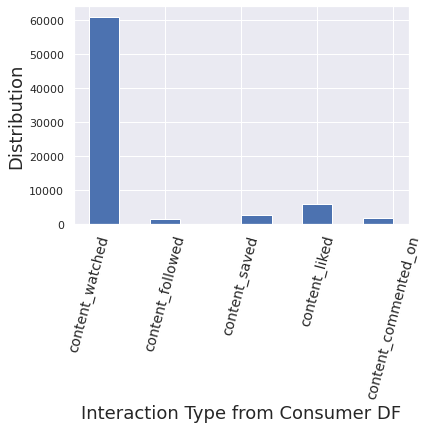

In [27]:
plt.hist(consumer_ds.interaction_type)
plt.xlabel('Interaction Type from Consumer DF', fontsize=18)
plt.ylabel('Distribution', fontsize=18)
plt.xticks(rotation=75, fontsize=14)
plt.show()

##### As visible from above histogram, the most comment interaction type for users on the app is 'content_watched', following by some 'content_liked'

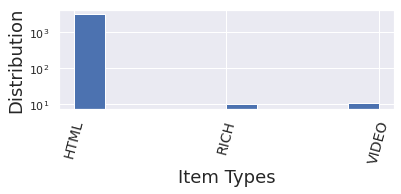

In [28]:
fig = plt.figure()
ax = fig.add_subplot(2, 1, 1)
ax.set_yscale('log')
plt.hist(platform_ds.item_type)
plt.xlabel('Item Types', fontsize=18)
plt.ylabel('Distribution', fontsize=18)
plt.xticks(rotation=75, fontsize=14)
plt.show()

##### As visible from above histogram, the most comment item type is 'HTML'

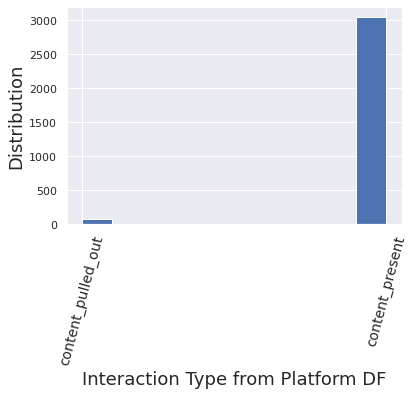

In [29]:
plt.hist(platform_ds.interaction_type)
plt.xlabel('Interaction Type from Platform DF', fontsize=18)
plt.ylabel('Distribution', fontsize=18)
plt.xticks(rotation=75, fontsize=14)
plt.show()

##### As visible from above histogram, the most comment interaction type from (platform dataset) is 'content_present'

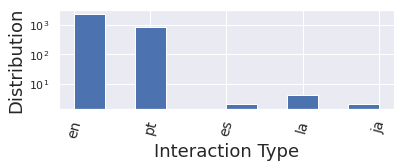

In [30]:
fig = plt.figure()
ax = fig.add_subplot(2, 1, 1)
ax.set_yscale('log')
plt.hist(platform_ds.language)
plt.xlabel('Interaction Type', fontsize=18)
plt.ylabel('Distribution', fontsize=18)
plt.xticks(rotation=75, fontsize=14)
plt.show()

##### As visible from above histogram, the most comment language of users is 'en', that is, English followed by 'pt' for Portuguese


### Some Bar Graph Plots

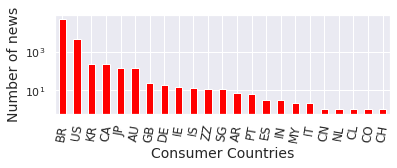

In [31]:
fig = plt.figure()
ax = fig.add_subplot(2, 1, 1)
ax.set_yscale('log')
country=consumer_ds.country
country.value_counts().plot(kind='bar', color='red')
plt.xlabel('Consumer Countries', fontsize=14)
plt.ylabel('Number of news', fontsize=14)
plt.xticks(rotation=80, fontsize=12)
plt.show()

In [32]:
consumer_ds['device_name'] = consumer_ds.consumer_device_info.str.split().str.get(0)

In [33]:
consumer_ds.head()

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,Ratings,device_name
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN,1,NaN
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/52.0.2743.24 Safari/537.36",NY,US,1,Mozilla/5.0
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN,1,NaN
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN,5,NaN
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN,1,NaN


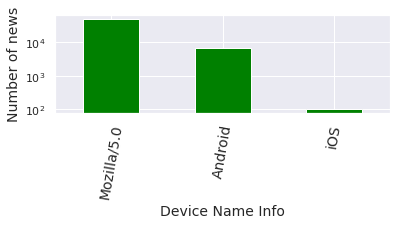

In [34]:
fig = plt.figure()
ax = fig.add_subplot(2, 1, 1)
ax.set_yscale('log')
device_n=consumer_ds.device_name
device_n.value_counts().plot(kind='bar', color='green')
plt.xlabel('Device Name Info', fontsize=14)
plt.ylabel('Number of news', fontsize=14)
plt.xticks(rotation=80, fontsize=14)
plt.show()

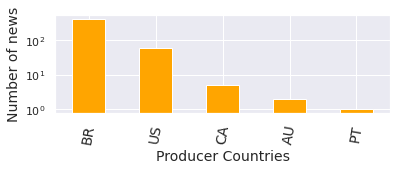

In [35]:
fig = plt.figure()
ax = fig.add_subplot(2, 1, 1)
ax.set_yscale('log')
prod_country=platform_ds1.producer_country
prod_country.value_counts().plot(kind='bar', color='orange')
plt.xlabel('Producer Countries', fontsize=14)
plt.ylabel('Number of news', fontsize=14)
plt.xticks(rotation=80, fontsize=14)
plt.show()

In [36]:
# Interaction Type --> Ratings Calculation

interact_ds1 = consumer_ds['interaction_type'].value_counts()*100/consumer_ds.shape[0]

In [37]:
interact_ds = pd.DataFrame(interact_ds1)

In [38]:
interact_ds.reset_index(inplace=True)

In [39]:
interact_ds.columns = ['interaction_type', 'value']
interact_ds

,interaction_type,value
0,content_watched,84.475606
1,content_liked,7.944739
2,content_saved,3.406074
3,content_commented_on,2.227846
4,content_followed,1.945735


In [40]:
# Rating Value

interact_ds['rating'] = 100/interact_ds['value']
interact_ds

,interaction_type,value,rating
0,content_watched,84.475606,1.183774
1,content_liked,7.944739,12.586945
2,content_saved,3.406074,29.359318
3,content_commented_on,2.227846,44.886406
4,content_followed,1.945735,51.394456


In [41]:
user_rating = pd.merge(consumer_ds, interact_ds, on='interaction_type', how='left')

In [42]:
user_rating = user_rating[['consumer_id', 'item_id', 'rating']]

In [43]:
user_rating.drop_duplicates(inplace=True)
user_rating.shape

(50938, 3)

In [44]:
user_rating.head(3)

,consumer_id,item_id,rating
0,-8845298781299428018,-3499919498720038879,1.183774
1,-1032019229384696495,8890720798209849691,1.183774
2,-1130272294246983140,310515487419366995,1.183774


In [45]:
user_rating['news_id'] = user_rating.groupby(['item_id']).ngroup()

In [46]:
user_rating['user_id'] = user_rating.groupby(['consumer_id']).ngroup()

In [47]:
user_rating.head(3)

,consumer_id,item_id,rating,news_id,user_id
0,-8845298781299428018,-3499919498720038879,1.183774,933,33
1,-1032019229384696495,8890720798209849691,1.183774,2933,831
2,-1130272294246983140,310515487419366995,1.183774,1537,826


In [48]:
ratings_ds = user_rating[['user_id','news_id','rating']]

In [49]:
ratings_ds.head(3)

,user_id,news_id,rating
0,33,933,1.183774
1,831,2933,1.183774
2,826,1537,1.183774


# 3. Collaborative Filtering: User Based Recommendations

In [50]:
consumer_ds.head()

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,Ratings,device_name
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN,1,NaN
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/52.0.2743.24 Safari/537.36",NY,US,1,Mozilla/5.0
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN,1,NaN
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN,5,NaN
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN,1,NaN


In [51]:
consumer_ds.item_id.nunique()

2987

In [52]:
# Test and Train split of the dataset.
from sklearn.model_selection import train_test_split
train, test = train_test_split(consumer_ds, test_size=0.30, random_state=31)

In [53]:
print(train.shape)
print(test.shape)

(50618, 10)
(21694, 10)


In [54]:
# Pivot the train ratings' dataset into matrix format in which columns are item IDs and the rows are user IDs.
df_pivot = train.pivot_table(
    index='consumer_id',
    columns='item_id',
    values='Ratings'
).fillna(0)

df_pivot.head()

item_id               -9222795471790223670  -9216926795620865886  \
consumer_id                                                        
-9223121837663643404                   0.0                   0.0   
-9212075797126931087                   0.0                   0.0   
-9207251133131336884                   0.0                   1.0   
-9199575329909162940                   0.0                   0.0   
-9196668942822132778                   0.0                   0.0   

item_id               -9194572880052200111  -9192549002213406534  \
consumer_id                                                        
-9223121837663643404                   0.0                   0.0   
-9212075797126931087                   0.0                   0.0   
-9207251133131336884                   0.0                   0.0   
-9199575329909162940                   0.0                   0.0   
-9196668942822132778                   0.0                   0.0   

item_id               -9190737901804729417  -9189659052158407108  \
consumer_id                                                        
-9223121837663643404                   0.0                   0.0   
-9212075797126931087                   0.0                   0.0   
-9207251133131336884                   0.0                   0.0   
-9199575329909162940                   0.0                   0.0   
-9196668942822132778                   0.0                   0.0   

item_id               -9184137057748005562  -9176143510534135851  \
consumer_id                                                        
-9223121837663643404                   0.0                   0.0   
-9212075797126931087                   0.0                   0.0   
-9207251133131336884                   0.0                   0.0   
-9199575329909162940                   0.0                   0.0   
-9196668942822132778                   0.0                   0.0   

item_id               -9172673334835262304  -9171475473795142532  \
consumer_id                                                        
-9223121837663643404                   0.0                   0.0   
-9212075797126931087                   0.0                   0.0   
-9207251133131336884                   0.0                   0.0   
-9199575329909162940                   0.0                   0.0   
-9196668942822132778                   0.0                   0.0   

item_id               -9166778629773133902  -9161596996229760398  \
consumer_id                                                        
-9223121837663643404                   0.0                   0.0   
-9212075797126931087                   0.0                   0.0   
-9207251133131336884                   0.0                   0.0   
-9199575329909162940                   0.0                   0.0   
-9196668942822132778                   0.0                   0.0   

item_id               -9160910454530522563  -9157338616628196758  \
consumer_id                                                        
-9223121837663643404                   0.0                   0.0   
-9212075797126931087                   0.0                   0.0   
-9207251133131336884                   0.0                   0.0   
-9199575329909162940                   0.0                   0.0   
-9196668942822132778                   0.0                   0.0   

item_id               -9153494109165200346  -9147114693160126293  \
consumer_id                                                        
-9223121837663643404                   0.0                   0.0   
-9212075797126931087                   0.0                   0.0   
-9207251133131336884                   0.0                   0.0   
-9199575329909162940                   0.0                   0.0   
-9196668942822132778                   0.0                   0.0   

item_id               -9137036168156595470  -9128741757954228992  \
consumer_id                                                        
-9223121837663643404                   0.0      

In [55]:
df_pivot.shape

(1815, 2917)

In [56]:
# Copy the train dataset into dummy_train
dummy_train = train.copy()

In [57]:
dummy_train.head(2)

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,Ratings,device_name
1725,1462892180,content_watched,-205193648629294862,6644119361202586331,-4325343075144702769,"Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.94 Safari/537.36",SP,BR,1,Mozilla/5.0
254,1463360317,content_watched,-6858240061363309239,-5823562314929634489,-3144035296667611204,"Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.102 Safari/537.36",MG,BR,1,Mozilla/5.0


In [58]:
# The movies not rated by user is marked as 1 for prediction. 
dummy_train['Ratings'] = dummy_train['Ratings'].apply(lambda x: 0 if x>=1 else 1)

In [59]:
# Convert the dummy train dataset into matrix format.
dummy_train = dummy_train.pivot_table(
    index='consumer_id',
    columns='item_id',
    values='Ratings'
).fillna(1)

In [60]:
dummy_train.head()

item_id               -9222795471790223670  -9216926795620865886  \
consumer_id                                                        
-9223121837663643404                   1.0                   1.0   
-9212075797126931087                   1.0                   1.0   
-9207251133131336884                   1.0                   0.0   
-9199575329909162940                   1.0                   1.0   
-9196668942822132778                   1.0                   1.0   

item_id               -9194572880052200111  -9192549002213406534  \
consumer_id                                                        
-9223121837663643404                   1.0                   1.0   
-9212075797126931087                   1.0                   1.0   
-9207251133131336884                   1.0                   1.0   
-9199575329909162940                   1.0                   1.0   
-9196668942822132778                   1.0                   1.0   

item_id               -9190737901804729417  -9189659052158407108  \
consumer_id                                                        
-9223121837663643404                   1.0                   1.0   
-9212075797126931087                   1.0                   1.0   
-9207251133131336884                   1.0                   1.0   
-9199575329909162940                   1.0                   1.0   
-9196668942822132778                   1.0                   1.0   

item_id               -9184137057748005562  -9176143510534135851  \
consumer_id                                                        
-9223121837663643404                   1.0                   1.0   
-9212075797126931087                   1.0                   1.0   
-9207251133131336884                   1.0                   1.0   
-9199575329909162940                   1.0                   1.0   
-9196668942822132778                   1.0                   1.0   

item_id               -9172673334835262304  -9171475473795142532  \
consumer_id                                                        
-9223121837663643404                   1.0                   1.0   
-9212075797126931087                   1.0                   1.0   
-9207251133131336884                   1.0                   1.0   
-9199575329909162940                   1.0                   1.0   
-9196668942822132778                   1.0                   1.0   

item_id               -9166778629773133902  -9161596996229760398  \
consumer_id                                                        
-9223121837663643404                   1.0                   1.0   
-9212075797126931087                   1.0                   1.0   
-9207251133131336884                   1.0                   1.0   
-9199575329909162940                   1.0                   1.0   
-9196668942822132778                   1.0                   1.0   

item_id               -9160910454530522563  -9157338616628196758  \
consumer_id                                                        
-9223121837663643404                   1.0                   1.0   
-9212075797126931087                   1.0                   1.0   
-9207251133131336884                   1.0                   1.0   
-9199575329909162940                   1.0                   1.0   
-9196668942822132778                   1.0                   1.0   

item_id               -9153494109165200346  -9147114693160126293  \
consumer_id                                                        
-9223121837663643404                   1.0                   1.0   
-9212075797126931087                   1.0                   1.0   
-9207251133131336884                   1.0                   1.0   
-9199575329909162940                   1.0                   1.0   
-9196668942822132778                   1.0                   1.0   

item_id               -9137036168156595470  -9128741757954228992  \
consumer_id                                                        
-9223121837663643404                   1.0      

# User Similarity Matrix

## Using Cosine Similarity

In [61]:
df_pivot.index.nunique()

1815

In [62]:
from sklearn.metrics.pairwise import pairwise_distances

# Creating the User Similarity Matrix using pairwise_distance function.
user_correlation = 1 - pairwise_distances(df_pivot, metric='cosine')
user_correlation[np.isnan(user_correlation)] = 0
print(user_correlation)

[[1.         0.         0.         ... 0.         0.0556846  0.03012271]
 [0.         1.         0.15749532 ... 0.         0.         0.        ]
 [0.         0.15749532 1.         ... 0.2975674  0.19019367 0.        ]
 ...
 [0.         0.         0.2975674  ... 1.         0.10203583 0.        ]
 [0.0556846  0.         0.19019367 ... 0.10203583 1.         0.        ]
 [0.03012271 0.         0.         ... 0.         0.         1.        ]]


In [63]:
user_correlation.shape

(1815, 1815)

## Using adjusted Cosine 

### Here, we are not removing the NaN values and calculating the mean only for the news rated by the user

In [64]:
# Create a user-movie matrix.
df_pivot = train.pivot_table(
    index='consumer_id',
    columns='item_id',
    values='Ratings'
)

In [65]:
df_pivot.head()

item_id               -9222795471790223670  -9216926795620865886  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   1.0   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9194572880052200111  -9192549002213406534  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9190737901804729417  -9189659052158407108  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9184137057748005562  -9176143510534135851  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9172673334835262304  -9171475473795142532  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9166778629773133902  -9161596996229760398  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9160910454530522563  -9157338616628196758  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9153494109165200346  -9147114693160126293  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9137036168156595470  -9128741757954228992  \
consumer_id                                                        
-9223121837663643404                   NaN      

In [66]:
mean = np.nanmean(df_pivot, axis=1)
df_subtracted = (df_pivot.T-mean).T

In [67]:
df_subtracted.head()

item_id               -9222795471790223670  -9216926795620865886  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN              -0.47619   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9194572880052200111  -9192549002213406534  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9190737901804729417  -9189659052158407108  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9184137057748005562  -9176143510534135851  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9172673334835262304  -9171475473795142532  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9166778629773133902  -9161596996229760398  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9160910454530522563  -9157338616628196758  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9153494109165200346  -9147114693160126293  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9137036168156595470  -9128741757954228992  \
consumer_id                                                        
-9223121837663643404                   NaN      

### Finding cosine similarity

In [68]:
from sklearn.metrics.pairwise import pairwise_distances

# Creating the User Similarity Matrix using pairwise_distance function.
user_correlation = 1 - pairwise_distances(df_subtracted.fillna(0), metric='cosine')
user_correlation[np.isnan(user_correlation)] = 0
print(user_correlation)

[[ 1.          0.          0.         ...  0.          0.
   0.00414714]
 [ 0.          1.         -0.28988552 ...  0.          0.
   0.        ]
 [ 0.         -0.28988552  1.         ... -0.01985099  0.
   0.        ]
 ...
 [ 0.          0.         -0.01985099 ...  1.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.00414714  0.          0.         ...  0.          0.
   1.        ]]


In [69]:
user_correlation.shape

(1815, 1815)

## Prediction - User User


In [70]:
user_correlation[user_correlation<0]=0
user_correlation

array([[1.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.00414714],
       [0.        , 1.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.00414714, 0.        , 0.        , ..., 0.        , 0.        ,
        1.        ]])

In [71]:
user_predicted_ratings = np.dot(user_correlation, df_pivot.fillna(0))
user_predicted_ratings

array([[0.01024361, 0.03078322, 0.01620902, ..., 0.00424412, 0.01097039,
        0.        ],
       [0.01953155, 1.56798967, 0.0032167 , ..., 0.02015276, 0.013669  ,
        0.        ],
       [0.02525702, 1.79997733, 0.39103094, ..., 0.03351159, 0.27005562,
        0.        ],
       ...,
       [0.        , 0.05530013, 0.07458524, ..., 0.        , 0.03959657,
        0.00809934],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.00934557, 0.        , 0.12275724, ..., 0.00862289, 0.09991645,
        0.00300108]])

In [72]:
user_predicted_ratings.shape

(1815, 2917)

In [73]:
user_predicted_ratings

array([[0.01024361, 0.03078322, 0.01620902, ..., 0.00424412, 0.01097039,
        0.        ],
       [0.01953155, 1.56798967, 0.0032167 , ..., 0.02015276, 0.013669  ,
        0.        ],
       [0.02525702, 1.79997733, 0.39103094, ..., 0.03351159, 0.27005562,
        0.        ],
       ...,
       [0.        , 0.05530013, 0.07458524, ..., 0.        , 0.03959657,
        0.00809934],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.00934557, 0.        , 0.12275724, ..., 0.00862289, 0.09991645,
        0.00300108]])

In [74]:
user_final_rating = np.multiply(user_predicted_ratings,dummy_train)
user_final_rating.head()

item_id               -9222795471790223670  -9216926795620865886  \
consumer_id                                                        
-9223121837663643404              0.010244              0.030783   
-9212075797126931087              0.019532              1.567990   
-9207251133131336884              0.025257              0.000000   
-9199575329909162940              0.030435              0.005941   
-9196668942822132778              0.000000              0.000000   

item_id               -9194572880052200111  -9192549002213406534  \
consumer_id                                                        
-9223121837663643404              0.016209              0.037489   
-9212075797126931087              0.003217              0.017857   
-9207251133131336884              0.391031              1.027720   
-9199575329909162940              0.002978              0.023755   
-9196668942822132778              0.000000              0.000000   

item_id               -9190737901804729417  -9189659052158407108  \
consumer_id                                                        
-9223121837663643404              0.000000              0.020862   
-9212075797126931087              0.000000              0.619878   
-9207251133131336884              0.000000              0.032033   
-9199575329909162940              0.022994              0.013292   
-9196668942822132778              0.000000              0.000000   

item_id               -9184137057748005562  -9176143510534135851  \
consumer_id                                                        
-9223121837663643404                   0.0              0.019963   
-9212075797126931087                   0.0              0.029891   
-9207251133131336884                   0.0              0.340028   
-9199575329909162940                   0.0              0.040945   
-9196668942822132778                   0.0              0.000000   

item_id               -9172673334835262304  -9171475473795142532  \
consumer_id                                                        
-9223121837663643404              0.004379              0.011308   
-9212075797126931087              0.000000              0.000000   
-9207251133131336884              0.000000              0.000000   
-9199575329909162940              0.000000              0.013842   
-9196668942822132778              0.000000              0.000000   

item_id               -9166778629773133902  -9161596996229760398  \
consumer_id                                                        
-9223121837663643404              0.004152              0.008456   
-9212075797126931087              0.000000              0.000000   
-9207251133131336884              0.080459              0.010551   
-9199575329909162940              0.000000              0.005864   
-9196668942822132778              0.000000              0.000000   

item_id               -9160910454530522563  -9157338616628196758  \
consumer_id                                                        
-9223121837663643404              0.023528              0.003769   
-9212075797126931087              0.008878              0.000000   
-9207251133131336884              0.248862              0.000000   
-9199575329909162940              0.010810              0.003072   
-9196668942822132778              0.000000              0.000000   

item_id               -9153494109165200346  -9147114693160126293  \
consumer_id                                                        
-9223121837663643404              0.004379              0.003084   
-9212075797126931087              0.000000              0.004541   
-9207251133131336884              0.000000              0.000000   
-9199575329909162940              0.000000              0.003095   
-9196668942822132778              0.000000              0.000000   

item_id               -9137036168156595470  -9128741757954228992  \
consumer_id                                                        
-9223121837663643404              0.301255      

### Finding the top 10 news recommendation for the user

In [75]:
# Take the user ID as input

# Taking 1st userID from above list

user_input = int(input("Enter your user name"))
print(user_input)

Enter your user name -9223121837663643404


-9223121837663643404


In [76]:
user_final_rating.head(7)

item_id               -9222795471790223670  -9216926795620865886  \
consumer_id                                                        
-9223121837663643404              0.010244              0.030783   
-9212075797126931087              0.019532              1.567990   
-9207251133131336884              0.025257              0.000000   
-9199575329909162940              0.030435              0.005941   
-9196668942822132778              0.000000              0.000000   
-9188188261933657343              0.000000              0.000000   
-9172914609055320039              0.000000              0.000000   

item_id               -9194572880052200111  -9192549002213406534  \
consumer_id                                                        
-9223121837663643404              0.016209              0.037489   
-9212075797126931087              0.003217              0.017857   
-9207251133131336884              0.391031              1.027720   
-9199575329909162940              0.002978              0.023755   
-9196668942822132778              0.000000              0.000000   
-9188188261933657343              0.000000              0.000000   
-9172914609055320039              0.000000              0.000000   

item_id               -9190737901804729417  -9189659052158407108  \
consumer_id                                                        
-9223121837663643404              0.000000              0.020862   
-9212075797126931087              0.000000              0.619878   
-9207251133131336884              0.000000              0.032033   
-9199575329909162940              0.022994              0.013292   
-9196668942822132778              0.000000              0.000000   
-9188188261933657343              0.000000              0.000000   
-9172914609055320039              0.000000              0.000000   

item_id               -9184137057748005562  -9176143510534135851  \
consumer_id                                                        
-9223121837663643404                   0.0              0.019963   
-9212075797126931087                   0.0              0.029891   
-9207251133131336884                   0.0              0.340028   
-9199575329909162940                   0.0              0.040945   
-9196668942822132778                   0.0              0.000000   
-9188188261933657343                   0.0              0.000000   
-9172914609055320039                   0.0              0.000000   

item_id               -9172673334835262304  -9171475473795142532  \
consumer_id                                                        
-9223121837663643404              0.004379              0.011308   
-9212075797126931087              0.000000              0.000000   
-9207251133131336884              0.000000              0.000000   
-9199575329909162940              0.000000              0.013842   
-9196668942822132778              0.000000              0.000000   
-9188188261933657343              0.000000              0.000000   
-9172914609055320039              0.000000              0.000000   

item_id               -9166778629773133902  -9161596996229760398  \
consumer_id                                                        
-9223121837663643404              0.004152              0.008456   
-9212075797126931087              0.000000              0.000000   
-9207251133131336884              0.080459              0.010551   
-9199575329909162940              0.000000              0.005864   
-9196668942822132778              0.000000              0.000000   
-9188188261933657343              0.000000              0.000000   
-9172914609055320039              0.000000              0.000000   

item_id               -9160910454530522563  -9157338616628196758  \
consumer_id                                                        
-9223121837663643404              0.023528              0.003769   
-9212075797126931087              0.008878              0.000000   
-9207251133131336884              0.248862        

In [77]:
d = user_final_rating.loc[user_input].sort_values(ascending=False)[0:10]
d

item_id
-5813211845057621660    1.008880
 569574447134368517     0.999032
 9175693555063886126    0.879710
-8627051188605351707    0.867420
 2930191803881821526    0.850632
 2362495898257544462    0.848988
-2923886912694084893    0.827211
 1469580151036142903    0.821791
-6340141548068597572    0.817818
-3482581255202910790    0.814551
Name: -9223121837663643404, dtype: float64

In [78]:
d2 = consumer_ds[['item_id', 'consumer_id']]

In [79]:
item_user_pair = pd.merge(d, d2, on = 'item_id', how='left')

In [80]:
item_user_pair[:10]

,item_id,-9223121837663643404,consumer_id
0,-5813211845057621660,1.00888,5321535590192312132
1,-5813211845057621660,1.00888,-3416264867487266035
2,-5813211845057621660,1.00888,-1119397949556155765
3,-5813211845057621660,1.00888,-8336698712796133957
4,-5813211845057621660,1.00888,-4246695160507476121
5,-5813211845057621660,1.00888,8698209668239173600
6,-5813211845057621660,1.00888,-1694477146133918626
7,-5813211845057621660,1.00888,-4246040813531967142
8,-5813211845057621660,1.00888,953707509720613429
9,-5813211845057621660,1.00888,-1863544689523892600


In [81]:
d3 = pd.merge(d,consumer_ds,left_on='item_id',right_on='item_id', how = 'left')
d3[:10]

,item_id,-9223121837663643404,event_timestamp,interaction_type,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,Ratings,device_name
0,-5813211845057621660,1.00888,1484916779,content_watched,5321535590192312132,-5916139805775449415,"Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/54.0.2840.90 Safari/537.36",MG,BR,1,Mozilla/5.0
1,-5813211845057621660,1.00888,1484920912,content_watched,-3416264867487266035,6562454120692848435,"Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/55.0.2883.87 Safari/537.36",TX,US,1,Mozilla/5.0
2,-5813211845057621660,1.00888,1484958286,content_watched,-1119397949556155765,1692990166127786179,"Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/55.0.2883.87 Safari/537.36",SP,BR,1,Mozilla/5.0
3,-5813211845057621660,1.00888,1485096904,content_watched,-8336698712796133957,-9136523227290503140,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_6) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/55.0.2883.95 Safari/537.36",SP,BR,1,Mozilla/5.0
4,-5813211845057621660,1.00888,1485185036,content_watched,-4246695160507476121,7168759783234899707,"Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_3) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/55.0.2883.95 Safari/537.36",CA,US,1,Mozilla/5.0
5,-5813211845057621660,1.00888,1486078562,content_watched,8698209668239173600,-4073043662413631080,"Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/55.0.2883.87 Safari/537.36",SP,BR,1,Mozilla/5.0
6,-5813211845057621660,1.00888,1485164714,content_watched,-1694477146133918626,-3177470406178986928,"Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/55.0.2883.87 Safari/537.36",SP,BR,1,Mozilla/5.0
7,-5813211845057621660,1.00888,1485166336,content_watched,-4246040813531967142,-4133641907407219374,"Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.94 Safari/537.36",SP,BR,1,Mozilla/5.0
8,-5813211845057621660,1.00888,1485164493,content_watched,953707509720613429,-7650805014573071115,"Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/55.0.2883.87 Safari/537.36",SP,BR,1,Mozilla/5.0
9,-5813211845057621660,1.00888,1485164895,content_watched,-1863544689523892600,-115476466562230183,"Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/55.0.2883.87 Safari/537.36",SP,BR,1,Mozilla/5.0


# Evaluation - User User 

In [82]:
# Find out the common users of test and train dataset.
common = test[test.consumer_id.isin(train.consumer_id)]
common.shape

(21576, 10)

In [83]:
common.head()

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,Ratings,device_name
42589,1469476310,content_liked,5445999759138709405,-7531858294361854119,2624608693925912718,NaN,NaN,NaN,2,NaN
12764,1461959859,content_liked,-6467708104873171151,-3596626804281480007,1112176729459344673,NaN,NaN,NaN,2,NaN
24508,1463498529,content_watched,-3759596852696130492,4313045637915476309,3681779508468526547,"Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.94 Safari/537.36",SP,BR,1,Mozilla/5.0
53780,1473770997,content_liked,-6843047699859121724,-8424644554119645763,-2253271881556150864,NaN,NaN,NaN,2,NaN
7858,1465492901,content_watched,-5507019982244746725,3803524018159743904,-5869126609583858485,NaN,NaN,NaN,1,NaN


In [84]:
# convert into the user-movie matrix.
common_user_based_matrix = common.pivot_table(index='consumer_id', columns='item_id', values='Ratings')

In [85]:
common_user_based_matrix.head()

item_id               -9222795471790223670  -9216926795620865886  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   2.0   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9194572880052200111  -9192549002213406534  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9190737901804729417  -9189659052158407108  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9176143510534135851  -9171475473795142532  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9166778629773133902  -9161596996229760398  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9160910454530522563  -9157338616628196758  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9152398073968262186  -9147114693160126293  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9137036168156595470  -9128741757954228992  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   
-9199575329909162940                   NaN                   NaN   
-9196668942822132778                   NaN                   NaN   

item_id               -9128652074338368262  -9107331682787867601  \
consumer_id                                                        
-9223121837663643404                   NaN      

In [86]:
# Convert the user_correlation matrix into dataframe.
user_correlation_df = pd.DataFrame(user_correlation)

In [87]:
user_correlation_df.head()

0     1     2         3     4     5     6         7     8     9     \
0  1.000000   0.0   0.0  0.004382   0.0   0.0   0.0  0.000000   0.0   0.0   
1  0.000000   1.0   0.0  0.000000   0.0   0.0   0.0  0.025126   0.0   0.0   
2  0.000000   0.0   1.0  0.000000   0.0   0.0   0.0  0.000000   0.0   0.0   
3  0.004382   0.0   0.0  1.000000   0.0   0.0   0.0  0.000000   0.0   0.0   
4  0.000000   0.0   0.0  0.000000   0.0   0.0   0.0  0.000000   0.0   0.0   

   10    11    12    13    14    15    16        17    18        19    20    \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0  0.003319   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0  0.000000   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.087059   0.0  0.000000   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0  0.000000   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0  0.000000   0.0   

   21    22    23    24    25    26        27    28    29        30    \
0   0.0   0.0   0.0   0.0   0.0   0.0  0.001848   0.0   0.0  0.000000   
1   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0   0.0  0.000000   
2   0.0   0.0   0.0   0.0   0.0   0.0  0.678979   0.0   0.0  0.254442   
3   0.0   0.0   0.0   0.0   0.0   0.0  0.007532   0.0   0.0  0.000000   
4   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0   0.0  0.000000   

       31    32    33    34    35    36    37    38        39    40    \
0  0.002132   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000989   0.0   
1  0.000000   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0   
2  0.000000   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0   
3  0.000000   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0   
4  0.000000   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0   

       41    42    43    44    45    46    47    48    49    50       51    \
0  0.003843   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.00000   
1  0.000000   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.00000   
2  0.000000   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.01383   
3  0.000000   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.00000   
4  0.000000   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.00000   

       52    53    54    55        56        57        58    59    60    61    \
0  0.001566   0.0   0.0   0.0  0.002263  0.001722  0.000000   0.0   0.0   0.0   
1  0.000000   0.0   0.0   0.0  0.000000  0.000000  0.000000   0.0   0.0   0.0   
2  0.000000   0.0   0.0   0.0  0.000000  0.070720  0.055062   0.0   0.0   0.0   
3  0.000000   0.0   0.0   0.0  0.000000  0.000000  0.000000   0.0   0.0   0.0   
4  0.000000   0.0   0.0   0.0  0.000000  0.000000  0.000000   0.0   0.0   0.0   

   62    63    64        65    66    67    68        69    70    71    72    \
0   0.0   0.0   0.0  0.003769   0.0   0.0   0.0  0.013387   0.0   0.0   0.0   
1   0.0   0.0   0.0  0.000000   0.0   0.0   0.0  0.000000   0.0   0.0   0.0   
2   0.0   0.0   0.0  0.000000   0.0   0.0   0.0  0.000000   0.0   0.0   0.0   
3   0.0   0.0   0.0  0.003072   0.0   0.0   0.0  0.000000   0.0   0.0   0.0   
4   0.0   0.0   0.0  0.000000   0.0   0.0   0.0  0.000000   0.0   0.0   0.0   

   73    74    75        76        77    78    79        80        81    82    \
0   0.0   0.0   0.0  0.002438  0.008088   0.0   0.0  0.010297  0.003083   0.0   
1   0.0   0.0   0.0  0.000000  0.000000   0.0   0.0  0.038851  0.000000   0.0   
2   0.0   0.0   0.0  0.000000  0.000000   0.0   0.0  0.000000  0.000000   0.0   
3   0.0   0.0   0.0  0.009936  0.000000   0.0   0.0  0.000000  0.000000   0.0   
4   0.0   0.0   0.0  0.000000  0.000000   0.0   0.0  0.000000  0.000000   0.0   

   83    84    85    86        87    88        89    90    91    92    93    \
0   0.0   0.0   0.0   0.0  0.000901   0.0  0.000000   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0  0.000000   0.0  0.000000   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0  0.000000 

In [88]:
df_subtracted.head(3)

item_id               -9222795471790223670  -9216926795620865886  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN              -0.47619   

item_id               -9194572880052200111  -9192549002213406534  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9190737901804729417  -9189659052158407108  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9184137057748005562  -9176143510534135851  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9172673334835262304  -9171475473795142532  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9166778629773133902  -9161596996229760398  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9160910454530522563  -9157338616628196758  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9153494109165200346  -9147114693160126293  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9137036168156595470  -9128741757954228992  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9128652074338368262  -9107331682787867601  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9105040345021932755  -9103776596534246502  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN                   NaN   
-9207251133131336884                   NaN                   NaN   

item_id               -9102431381393428051  -9100490342054218852  \
consumer_id                                                        
-9223121837663643404                   NaN                   NaN   
-9212075797126931087                   NaN   

In [89]:
user_correlation_df['consumer_id'] = df_subtracted.index

user_correlation_df.set_index('consumer_id',inplace=True)
user_correlation_df.head()

0    1    2         3    4    5    6         7  \
consumer_id                                                                   
-9223121837663643404  1.000000  0.0  0.0  0.004382  0.0  0.0  0.0  0.000000   
-9212075797126931087  0.000000  1.0  0.0  0.000000  0.0  0.0  0.0  0.025126   
-9207251133131336884  0.000000  0.0  1.0  0.000000  0.0  0.0  0.0  0.000000   
-9199575329909162940  0.004382  0.0  0.0  1.000000  0.0  0.0  0.0  0.000000   
-9196668942822132778  0.000000  0.0  0.0  0.000000  0.0  0.0  0.0  0.000000   

                        8    9   10   11   12   13   14   15   16        17  \
consumer_id                                                                   
-9223121837663643404  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
-9212075797126931087  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
-9207251133131336884  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.087059   
-9199575329909162940  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   
-9196668942822132778  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.000000   

                       18        19   20   21   22   23   24   25   26  \
consumer_id                                                              
-9223121837663643404  0.0  0.003319  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
-9212075797126931087  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
-9207251133131336884  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
-9199575329909162940  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
-9196668942822132778  0.0  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

                            27   28   29        30        31   32   33   34  \
consumer_id                                                                   
-9223121837663643404  0.001848  0.0  0.0  0.000000  0.002132  0.0  0.0  0.0   
-9212075797126931087  0.000000  0.0  0.0  0.000000  0.000000  0.0  0.0  0.0   
-9207251133131336884  0.678979  0.0  0.0  0.254442  0.000000  0.0  0.0  0.0   
-9199575329909162940  0.007532  0.0  0.0  0.000000  0.000000  0.0  0.0  0.0   
-9196668942822132778  0.000000  0.0  0.0  0.000000  0.000000  0.0  0.0  0.0   

                       35   36   37   38        39   40        41   42   43  \
consumer_id                                                                   
-9223121837663643404  0.0  0.0  0.0  0.0  0.000989  0.0  0.003843  0.0  0.0   
-9212075797126931087  0.0  0.0  0.0  0.0  0.000000  0.0  0.000000  0.0  0.0   
-9207251133131336884  0.0  0.0  0.0  0.0  0.000000  0.0  0.000000  0.0  0.0   
-9199575329909162940  0.0  0.0  0.0  0.0  0.000000  0.0  0.000000  0.0  0.0   
-9196668942822132778  0.0  0.0  0.0  0.0  0.000000  0.0  0.000000  0.0  0.0   

                       44   45   46   47   48   49   50       51        52  \
consumer_id                                                                  
-9223121837663643404  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00000  0.001566   
-9212075797126931087  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00000  0.000000   
-9207251133131336884  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.01383  0.000000   
-9199575329909162940  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00000  0.000000   
-9196668942822132778  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00000  0.000000   

                       53   54   55        56        57        58   59   60  \
consumer_id                                                                   
-9223121837663643404  0.0  0.0  0.0  0.002263  0.001722  0.000000  0.0  0.0   
-9212075797126931087  0.0  0.0  0.0  0.000000  0.000000  0.000000  0.0  0.0   
-9207251133131336884  0.0  0.0  0.0  0.000000  0.070720  0.055062  0.0  0.0   
-9199575329909162940  0.0  0.0  0.0  0.000000  0.000000  0.000000  0.0  0.0   
-9196668942822132778  0.0  0.0  0.0  0.000000  0.000000  0.000000  0.0  0.0   

                       61   62   63   64        65   66   67   68        69  \
consumer_id                                                                   
-9223121837663643404  0.0  0.0  0.0

In [90]:
common.head(3)

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,Ratings,device_name
42589,1469476310,content_liked,5445999759138709405,-7531858294361854119,2624608693925912718,NaN,NaN,NaN,2,NaN
12764,1461959859,content_liked,-6467708104873171151,-3596626804281480007,1112176729459344673,NaN,NaN,NaN,2,NaN
24508,1463498529,content_watched,-3759596852696130492,4313045637915476309,3681779508468526547,"Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.94 Safari/537.36",SP,BR,1,Mozilla/5.0


In [91]:
list_name = common.consumer_id.tolist()

user_correlation_df.columns = df_subtracted.index.tolist()


user_correlation_df_1 =  user_correlation_df[user_correlation_df.index.isin(list_name)]

In [92]:
user_correlation_df_1.shape

(1504, 1815)

In [93]:
user_correlation_df_2 = user_correlation_df_1.T[user_correlation_df_1.T.index.isin(list_name)]

In [94]:
user_correlation_df_3 = user_correlation_df_2.T

In [ ]:
user_correlation_df_3.head()

In [ ]:
user_correlation_df_3.shape

In [ ]:
user_correlation_df_3[user_correlation_df_3<0]=0

common_user_predicted_ratings = np.dot(user_correlation_df_3, common_user_based_matrix.fillna(0))
common_user_predicted_ratings

In [ ]:
dummy_test = common.copy()

dummy_test['Ratings'] = dummy_test['Ratings'].apply(lambda x: 1 if x>=1 else 0)

dummy_test = dummy_test.pivot_table(index='consumer_id', columns='item_id', values='Ratings').fillna(0)

In [ ]:
dummy_test.shape

In [ ]:
common_user_based_matrix.head()

In [ ]:
dummy_test.head(3)

In [ ]:
common_user_predicted_ratings = np.multiply(common_user_predicted_ratings,dummy_test)

In [ ]:
common_user_predicted_ratings.head()

# Model Evaluation

### RMSE

Calculating the RMSE for only the news rated by users. For RMSE, normalising the rating to (1,5) range.

In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
from math import sqrt

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from numpy import *

X  = common_user_predicted_ratings.copy() 
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 5))
print(scaler.fit(X))
y = (scaler.transform(X))

print(y)

In [ ]:
common_ = common.pivot_table(index='consumer_id', columns='item_id', values='Ratings')

In [ ]:
# Finding total non-NaN value
total_non_nan = np.count_nonzero(~np.isnan(y))

In [ ]:
rmse = (sum(sum((common_ - y )**2))/total_non_nan)**0.5
print(rmse)

### Precision@k

In [ ]:
user_index=20

In [ ]:
ratings_ds[ratings_ds['user_id']==20]

In [ ]:
user_set = ratings_ds[ratings_ds['user_id']==user_index].sort_values(by='rating',ascending=False)['news_id'].tolist()

In [ ]:
user_set

In [ ]:
len(user_set)

In [ ]:
predict_ds = pd.DataFrame(user_predicted_ratings)

In [ ]:
user_predicted_set = predict_ds.iloc[user_index].sort_values(ascending=False)[:10].index.tolist()

In [ ]:
len(user_predicted_set)

In [ ]:
user_predicted_set

In [ ]:
precision_at_10 = len(list(set(user_set) & set(user_predicted_set)))/10

In [ ]:
precision_at_10

# Using Item similarity

## Item Based Similarity

In [ ]:
df_pivot = train.pivot_table(
    index='consumer_id',
    columns='item_id',
    values='Ratings'
).T

df_pivot.head()

In [ ]:
mean = np.nanmean(df_pivot, axis=1)
df_subtracted = (df_pivot.T-mean).T

In [ ]:
df_subtracted.head()

In [ ]:
from sklearn.metrics.pairwise import pairwise_distances

In [ ]:
# Item Similarity Matrix
item_correlation = 1 - pairwise_distances(df_subtracted.fillna(0), metric='cosine')
item_correlation[np.isnan(item_correlation)] = 0
print(item_correlation)

In [ ]:
item_correlation.shape

In [ ]:
item_correlation[item_correlation<0]=0
item_correlation

## 4. Prediction - Item Item


In [ ]:
item_predicted_ratings = np.dot((df_pivot.fillna(0).T),item_correlation)
item_predicted_ratings

In [ ]:
item_predicted_ratings.shape

In [ ]:
dummy_train.shape

### Filtering the rating only for the news not rated by the user for recommendation

In [ ]:
item_final_rating = np.multiply(item_predicted_ratings,dummy_train)
item_final_rating.head()

### Finding the top 10 recommendation for the *user*

In [ ]:
# Take the user ID as input

# Taking 2nd user ID from above

user_input = int(input("Enter your user name"))
print(user_input)

In [ ]:
# Recommending the Top 10 products to the user.
d = item_final_rating.loc[user_input].sort_values(ascending=False)[0:10]
d

In [ ]:
d1 = pd.merge(d,consumer_ds,left_on='item_id',right_on='item_id',how = 'left')
d1[:10]

In [ ]:
train_new = pd.merge(train,consumer_ds,left_on='item_id',right_on='item_id',how='left')

In [ ]:
train_new[train_new.consumer_id_x == -9223121837663643404][:10]

# Evaluation - Item Item

In [ ]:
test.columns

In [ ]:
common =  test[test.item_id.isin(train.item_id)]
common.shape

In [ ]:
common.head()

In [ ]:
common_item_based_matrix = common.pivot_table(index='consumer_id', columns='item_id', values='Ratings').T

In [ ]:
common_item_based_matrix.shape

In [ ]:
item_correlation_df = pd.DataFrame(item_correlation)

In [ ]:
item_correlation_df.head(3)

In [ ]:
item_correlation_df['item_id'] = df_subtracted.index
item_correlation_df.set_index('item_id',inplace=True)
item_correlation_df.head()

In [ ]:
list_name = common.item_id.tolist()

In [ ]:
item_correlation_df.columns = df_subtracted.index.tolist()

item_correlation_df_1 =  item_correlation_df[item_correlation_df.index.isin(list_name)]

In [ ]:
item_correlation_df_2 = item_correlation_df_1.T[item_correlation_df_1.T.index.isin(list_name)]

item_correlation_df_3 = item_correlation_df_2.T

In [ ]:
item_correlation_df_3.head()

In [ ]:
item_correlation_df_3[item_correlation_df_3<0]=0

common_item_predicted_ratings = np.dot(item_correlation_df_3, common_item_based_matrix.fillna(0))
common_item_predicted_ratings

In [ ]:
common_item_predicted_ratings.shape

In [ ]:
dummy_test = common.copy()

dummy_test['Ratings'] = dummy_test['Ratings'].apply(lambda x: 1 if x>=1 else 0)

dummy_test = dummy_test.pivot_table(index='consumer_id', columns='item_id', values='Ratings').T.fillna(0)

common_item_predicted_ratings = np.multiply(common_item_predicted_ratings,dummy_test)

In [ ]:
common_ = common.pivot_table(index='consumer_id', columns='item_id', values='Ratings').T

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from numpy import *

X  = common_item_predicted_ratings.copy() 
X = X[X>0]

scaler = MinMaxScaler(feature_range=(1, 10))
print(scaler.fit(X))
y = (scaler.transform(X))

print(y)

In [ ]:
# Finding total non-nan value
total_non_nan = np.count_nonzero(~np.isnan(y))

In [ ]:
rmse = (sum(sum((common_ - y )**2))/total_non_nan)**0.5
print(rmse)

## Filtering News from Recommendation which are already seen by the user

In [ ]:
ds_user = ratings_ds[ratings_ds['user_id']==17]

In [ ]:
ds_user.head(3)

In [ ]:
ds_user.shape

In [ ]:
ratings_ds.head(3)

In [ ]:
prediction_ds = pd.DataFrame(user_predicted_ratings)

In [ ]:
prediction_ds.iloc[17].sort_values(ascending=False)[:10]

In [ ]:
user_rating_final = user_rating[['item_id', 'news_id']]

In [ ]:
user_rating_final = user_rating_final.drop_duplicates()

In [ ]:
user_rating_final.head(2)

In [ ]:
recommended_news_df = pd.DataFrame(prediction_ds.iloc[17].sort_values(ascending=False))

In [ ]:
recommended_news_df.reset_index(inplace=True)

In [ ]:
recommended_news_df.head()

In [ ]:
platform_ds3 = platform_ds[platform_ds['language']=='en']

In [ ]:
news_title = platform_ds3[['item_id', 'title']]

In [ ]:
news_title = platform_ds3[['item_id','title']]

In [ ]:
news_title.head()

In [ ]:
recommended_news_df.columns = ['news_id', 'score']

In [ ]:
recommended_news_df.head(2)

In [ ]:
recommended_merged = pd.merge(recommended_news_df, user_rating, how='left', on='news_id')

In [ ]:
recommended_merged.head(2)

In [ ]:
news_output = pd.merge(recommended_merged,news_title,how='left', on='item_id')

In [ ]:
news_output = news_output[['news_id', 'score', 'item_id', 'title']]

In [ ]:
news_output.head(2)

In [ ]:
merged_filter = pd.merge(news_output, ds_user, on='news_id', how='left')

In [ ]:
merged_filter.shape

In [ ]:
merged_filter.head(3)

In [ ]:
merged_filter = merged_filter.drop(merged_filter[merged_filter['rating']>0].index)

In [ ]:
merged_filter['title'][:10]

# 5. Content-based Filtering

In [ ]:
platform_ds1['text_description'].str.len()[:10]

#### Average keywords string length

In [ ]:
np.mean(platform_ds1['text_description'].str.len())

#### Number of Text Description

In [ ]:
number_of_text_description = []
for keywords in platform_ds1['text_description']:
    n_keywords = len(keywords.split(','))
    number_of_text_description.append(n_keywords)

In [ ]:
number_of_text_description[:10]

In [ ]:
sum(number_of_text_description)

# Plotting

In [ ]:
plt.hist(number_of_text_description)
plt.xlabel('Distribution of Number of Words in News Articles Text Description column')
plt.ylabel('Number of News')
plt.show()

##### Selected DF

In [ ]:
platform_ds1 = platform_ds1[['title', 'text_description']]

In [ ]:
platform_ds1.head(2)

In [ ]:
# Data Pre-Processing

import nltk
import string
import re
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer

ps = nltk.PorterStemmer()
wn = nltk.WordNetLemmatizer()


In [ ]:
def make_lower_case(text_description):
    return text_description.lower()

# Define function for removing stop words
def remove_stop_words(text_description):
    text_description = text_description.split()
    stops = set(stopwords.words("english"))
    text_description = [w for w in text_description if not w in stops]
    texts = [w for w in text_description if w.isalpha()]
    texts = " ".join(texts)
    return texts

# Define function for removing punctuation
def remove_punctuation(text_description):
    tokenizer = RegexpTokenizer(r'\w+')
    text_description = tokenizer.tokenize(text_description)
    text_description = " ".join(text_description)
    return text_description

# Define function for removing the html tags
def remove_html(text_description):
    html_pattern = re.compile('<.*?>')
    return html_pattern.sub(r'', text_description)


# Applying the above functions in column 'text_description' and storing as a new column named 'cleaned_desc'
platform_ds1['cleaned_desc'] = platform_ds1['text_description'].apply(func = make_lower_case)
platform_ds1['cleaned_desc'] = platform_ds1.cleaned_desc.apply(func = remove_stop_words)
platform_ds1['cleaned_desc'] = platform_ds1.cleaned_desc.apply(func = remove_punctuation)
platform_ds1['cleaned_desc'] = platform_ds1.cleaned_desc.apply(func = remove_html)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

In [ ]:
tf = TfidfVectorizer(analyzer='word',
                     stop_words='english',
                     max_df=0.8,
                     min_df=0.0,
                     use_idf=True,
                     ngram_range=(1,3))
tfidf_matrix = tf.fit_transform(platform_ds1['cleaned_desc'])

In [ ]:
platform_ds1.head(2)

In [ ]:
platform_ds1['cleaned_desc'][:2]

In [ ]:
platform_ds1 = platform_ds1.drop_duplicates(subset=None, keep='first', inplace=False)

In [ ]:
platform_ds1['cleaned_desc'][:2]

In [ ]:
platform_ds1.shape

### Create numpy array from text_description column

In [ ]:
keywords_array = platform_ds1['cleaned_desc'].to_numpy()

In [ ]:
type(keywords_array[0])

### Use splitting to generate words from keywords_array

In [ ]:
words_list = []
for keyword in keywords_array:
    splitted_words = keyword.lower().split(' ')
    words_list.append(splitted_words)

In [ ]:
len(words_list), len(words_list[0]), len(words_list[1]), len(words_list[10])

### Create Dictionary

In [ ]:
# Install Gensim

! pip install gensim

In [ ]:
from gensim.corpora.dictionary import Dictionary

create a dictionary of words from words list

In [ ]:
dictionary = Dictionary(words_list)

In [ ]:
dictionary

In [ ]:
len(dictionary)

#### Total number of words in the words_list

In [ ]:
number_words = 0
for word in words_list:
    number_words = number_words + len(word)

In [ ]:
number_words

In [ ]:
dictionary.get(0), dictionary.get(1), dictionary.get(20), dictionary.get(1000)

## Generate Bag of Words

#### doc2bow = Document to BOW[Bag of word]

In [ ]:
bow = dictionary.doc2bow(words_list[0])

In [ ]:
len(words_list[0]), len(bow)

### Generate Corpus by creating BOW of each document

In [ ]:
corpus = [dictionary.doc2bow(doc) for doc in words_list]

In [ ]:
#print(corpus)

In [ ]:
len(corpus), len(corpus[0]), len(corpus[1]), len(corpus[20])

In [ ]:
len(words_list), len(words_list[0])

### TF-IDF Model

#### TF = Term frequency -> count/no.

#### IDF = Inverse doc freq. -> log(N/n)

In [ ]:
from gensim.models.tfidfmodel import TfidfModel

In [ ]:
# Create tfidf model of the corpus

tfidf = TfidfModel(corpus)

In [ ]:
tfidf

In [ ]:
print(tfidf[corpus[0]])

## Generate Similarity Matrix

In [ ]:
from gensim.similarities import MatrixSimilarity

In [ ]:
sims = MatrixSimilarity(tfidf[corpus], num_features=len(dictionary))

In [ ]:
print(sims)

In [ ]:
sims[corpus[0]]

In [ ]:
len(sims[corpus[0]])

## Generate Recommendation

In [ ]:
news_title_str = "IEEE to Talk Blockchain at Cloud Computing Oxford-Con - CoinDesk"

In [ ]:
# number of recommedations

n=10

In [ ]:
platform_ds2 = platform_ds1.loc[platform_ds1.title==news_title_str] 

In [ ]:
platform_ds2

#### Generate words_list by splitting the keywords column

In [ ]:
words_list = platform_ds2['cleaned_desc'].iloc[0].split(' ')

#### set the query_doc to the words_list

In [ ]:
query_doc = words_list

In [ ]:
query_doc

#### Get the Bag Of Words

In [ ]:
query_doc_bow = dictionary.doc2bow(query_doc)

In [ ]:
query_doc_bow

In [ ]:
len(query_doc_bow), len(query_doc)

### Generate TF-IDF values for the query_doc_bow

In [ ]:
query_doc_tfidf = tfidf[query_doc_bow] 

In [ ]:
query_doc_tfidf

### Get Similarity Score using Similarity Matrix

In [ ]:
similarity_array = sims[query_doc_tfidf]

In [ ]:
similarity_array

In [ ]:
len(similarity_array)

### Create a Series to Visualize Similarity Score along with News Title

In [ ]:
similarity_series = pd.Series(similarity_array.tolist(), index=platform_ds1.title.values)

In [ ]:
similarity_series.head(10)

### Sort the series to get Top Recommended News

In [ ]:
recommended_news = similarity_series.sort_values(ascending=False)[1:n+1] 

In [ ]:
recommended_news.head

### Corpus for 15th index

In [ ]:
corpus[15]

In [ ]:
corpus[platform_ds2.index.values.tolist()[0]]

#### TF-IDF Values

In [ ]:
tfidf[corpus[platform_ds2.index.values.tolist()[0]]]

#### Sorted TF-IDF values

In [ ]:
sorted_tfidf_weights = sorted(tfidf[corpus[platform_ds1.index.values.tolist()[0]]], key=lambda w: w[1], reverse=True)

In [ ]:
sorted_tfidf_weights[:30]

In [ ]:
dictionary.get(3000)

In [ ]:
dictionary.get(5000)

In [ ]:
print('Top words associated with this news by tf-idf values are: ')
for term_id, weight in sorted_tfidf_weights[:10]:
    print(" '%s' %.5f" %(dictionary.get(term_id), weight))

In [ ]:
platform_ds2.columns

# Creating a Modular code by creating a function for Query News Input

In [ ]:
def news_recommendation(news_title_str, number_of_hits):
    platform_ds2 = platform_ds1.loc[platform_ds1.title==news_title_str] # get the news title row
    
    keywords = platform_ds2['cleaned_desc'].iloc[0].split(' ') # get the keywords as a Series (platform_ds2['cleaned_desc'])
    
    query_doc = keywords #set the query_doc to the list of keywords
    
    query_doc_bow = dictionary.doc2bow(query_doc) # get a bag of words from the query_doc
    
    query_doc_tfidf = tfidf[query_doc_bow] # convert the regular bag of words model to a tf-idf model

    similarity_array = sims[query_doc_tfidf] # get the array of similarity values between our news and every other news. 

    similarity_series = pd.Series(similarity_array.tolist(), index=platform_ds1.title.values) # convert to a Series
    
    recommended_news = similarity_series.sort_values(ascending=False)[1:number_of_hits+1] 
    
    # get the top matching results, i.e. most similar news title
    # start from index 1 because every item is most similar to itself
    
    return recommended_news

In [ ]:
type(recommended_news)

In [ ]:
news_recommendation("French Senate Will Debate on Bitcoin Regulation", 10)

In [ ]:
news_recommendation('Fooling The Machine', 10)

# 6. ALS Model - Alternating Least Square

## Building Recommendation system using ALS on Consumer Dataset

In [ ]:
consumer_ds.head(2)

In [ ]:
consumer_ds.shape

In [ ]:
consumer_ds['consumer_id'].nunique()

In [ ]:
consumer_ds['item_id'].nunique()

## Creating Sparse User-Item Matrix

In [ ]:
from scipy.sparse import csr_matrix

In [ ]:
alpha = 40

In [ ]:
consumer_ds.shape

In [ ]:
consumer_ds.dropna(inplace=True)

In [ ]:
consumer_ds = consumer_ds.drop_duplicates(subset=None, keep='first', inplace=False)

In [ ]:
consumer_ds.shape

In [ ]:
#consumer_ds['consumer_id_abs'] = consumer_ds['consumer_id'].apply(lambda x: abs(x))

In [ ]:
#consumer_ds['item_id_abs'] = consumer_ds['item_id'].apply(lambda x: abs(x))

In [ ]:
consumer_ds.head(2)

In [ ]:
type(consumer_ds)

In [ ]:
#sparse_user_item = csr_matrix( ([alpha]*consumer_ds.shape[0], (consumer_ds['consumer_id_abs'], consumer_ds['item_id_abs']) ))

In [ ]:
users_items_pivot_matrix_df = consumer_ds.pivot_table(index='consumer_id', 
                                                columns='item_id', 
                                                values='Ratings').fillna(0)

users_items_pivot_matrix_df.head(10)

In [ ]:
users_ids = list(users_items_pivot_matrix_df.index)
users_ids[:10]

In [ ]:
users_items_pivot_sparse_matrix = csr_matrix(users_items_pivot_matrix_df)
users_items_pivot_sparse_matrix

Shape 1895x2982 sparse matrix

In [ ]:
csr_user_array = users_items_pivot_sparse_matrix.toarray()

In [ ]:
csr_user_array

In [ ]:
len(csr_user_array), len(csr_user_array[0]), csr_user_array[1][1]

In [ ]:
max(csr_user_array[1])

### csr matrix only stores where value is 40 [non-zero]. (Compressed Sparse Row)

In [ ]:
print(users_items_pivot_sparse_matrix)

In [ ]:
users_items_pivot_sparse_matrix = users_items_pivot_sparse_matrix.T.tocsr()

In [ ]:
users_items_pivot_sparse_matrix

In [ ]:
csr_item_array = users_items_pivot_sparse_matrix.toarray()

In [ ]:
csr_item_array

In [ ]:
len(csr_item_array), len(csr_item_array[0]), csr_item_array[1][1]

In [ ]:
print(users_items_pivot_sparse_matrix)

In [ ]:
#! pip install implicit

In [ ]:
import implicit
from implicit.evaluation import train_test_split

In [ ]:
train, test = train_test_split(users_items_pivot_sparse_matrix, train_percentage=0.8)

In [ ]:
train

In [ ]:
test

In [ ]:
import os
os.environ['MKL_NUM_THREADS'] = '1'

In [ ]:
model = implicit.als.AlternatingLeastSquares(factors=100, regularization=0.1, iterations=20, calculate_training_loss=False)

In [ ]:
model

In [ ]:
# Train the Model

model.fit(train)

In [ ]:
user_id = 100

In [ ]:
consumer_ds['consumer_id'].loc[100]

In [ ]:
model.recommend(user_id, users_items_pivot_sparse_matrix[user_id])

In [ ]:
model.recommend(user_id, users_items_pivot_sparse_matrix[user_id], N=30)

### Generating recommendations for News_id / item_id

In [ ]:
item_id = 20
n_similar = 2982

In [ ]:
similar = model.similar_items(item_id, n_similar)

In [ ]:
similar

In [ ]:
output = pd.concat([pd.DataFrame(similar[0], columns=['news_id']),pd.DataFrame(similar[1], columns=['als_score'])],axis=1)


In [ ]:
output[:10]

## Merging recommendations

In [ ]:
consumer_ds1 = consumer_ds[['consumer_id', 'item_id', 'interaction_type']]

In [ ]:
# Consusmer Interaction Type
interaction = consumer_ds1['interaction_type'].value_counts()*100/consumer_ds1.shape[0]

In [ ]:
interaction

In [ ]:
interaction_ds = pd.DataFrame(interaction)

In [ ]:
type(interaction_ds)

In [ ]:
interaction_ds

In [ ]:
interaction_ds.reset_index(inplace=True)

In [ ]:
interaction_ds

In [ ]:
interaction_ds.columns = ['interaction_type', 'value']

### Creating a rating column

In [ ]:
interaction_ds['rating1'] = 100/interaction_ds['value']

In [ ]:
interaction_ds.head(3)

In [ ]:
consumer_ratings = pd.merge(consumer_ds1, interaction_ds, on='interaction_type', how='left')

In [ ]:
consumer_ratings.head(3)

In [ ]:
consumer_ratings = consumer_ratings[['consumer_id', 'item_id', 'rating1']]

In [ ]:
consumer_ratings.head(3)

In [ ]:
consumer_ratings.shape

In [ ]:
consumer_ratings['news_id'] = consumer_ratings.groupby(['item_id']).ngroup()

In [ ]:
consumer_ratings['user_id'] = consumer_ratings.groupby(['consumer_id']).ngroup()

In [ ]:
consumer_ratings.head(3)

In [ ]:
consumer_ratings.describe()

In [ ]:
ratings_ds = consumer_ratings[['user_id', 'news_id', 'rating1']]

In [ ]:
ratings_ds.head(3)

In [ ]:
news_mapping = consumer_ratings[['item_id', 'news_id']]

In [ ]:
news_mapping.head(3)

In [ ]:
news_mapping.shape

In [ ]:
news_mapping1 = news_mapping.drop_duplicates()

In [ ]:
news_mapping1.shape

In [ ]:
als_ds1 = pd.merge(output, news_mapping1, on='news_id', how='left')

In [ ]:
als_ds1.head()

In [ ]:
news_title.shape

In [ ]:
als_title = pd.merge(als_ds1, news_title, on='item_id', how='left')

In [ ]:
als_title.head(3)

In [ ]:
als_title.shape

In [ ]:
# Calculating ALS Score using Normalization

als_title['als_score_normalized'] = (als_title['als_score']-min(als_title['als_score'])) / (max(als_title['als_score']) - min(als_title['als_score']))

In [ ]:
als_title[:30]

# Hybrid Recommendation System

## Hybrid-1: Content Based + Item Based Collaboriative Model

In [ ]:
news_index = 30

In [ ]:
news_prediction = pd.DataFrame(item_correlation)

In [ ]:
news_prediction.head(3)

In [ ]:
item_recommendation = pd.DataFrame(news_prediction.iloc[news_index].sort_values(ascending=False))

In [ ]:
item_recommendation[:30]

In [ ]:
item_recommendation.reset_index(inplace=True)

In [ ]:
item_recommendation.columns = ['news_id', 'score']
item_recommendation.head(3)

### Merging

In [ ]:
merged_ds1 = pd.merge(item_recommendation, news_mapping1, on='news_id', how='left')

In [ ]:
merged_ds1.head(3)

In [ ]:
hybrid1 = pd.merge(merged_ds1, platform_ds3, on='item_id', how='left')

In [ ]:
hybrid1.shape

In [ ]:
hybrid1 = hybrid1[['news_id','item_id','title','score']]

In [ ]:
hybrid1.head(3)

In [ ]:
hybrid1['collaborative_score_normalized'] = (hybrid1['score']-min(hybrid1['score']))/(max(hybrid1['score'])-min(hybrid1['score']))

In [ ]:
hybrid1.head(3)

In [ ]:
news_recom = news_recommendation('Machine Learning for Designers', 10)

In [ ]:
news_ds = pd.DataFrame(news_recom)

In [ ]:
news_ds.head(3)

In [ ]:
news_ds.reset_index(inplace=True)

In [ ]:
news_ds.columns = ['title', 'score']

In [ ]:
news_ds.head(3)

In [ ]:
news_ds['content_score_normalized'] = (news_ds['score']-min(news_ds['score'])) / (max(news_ds['score'])-min(news_ds['score']))

In [ ]:
news_ds

In [ ]:
hybrid1_result = pd.merge(hybrid1, news_ds, how='left', on='title')

In [ ]:
hybrid1_result.head(3)

In [ ]:
hybrid1_result['Main_Score'] = (hybrid1_result['collaborative_score_normalized']+hybrid1_result['content_score_normalized'])/2

In [ ]:
hybrid1_result = hybrid1_result[['title','Main_Score']]

In [ ]:
hybrid1_result.shape

In [ ]:
hybrid1_result = hybrid1_result.drop_duplicates()

In [ ]:
hybrid1_result.sort_values(by='Main_Score', ascending=False)[:10]

## Hybrid-2: ALS + Item-based Collaborative Filtering

In [ ]:
hybrid2 = pd.merge(hybrid1, als_title, how='left', on='title')

In [ ]:
hybrid2.head(3)

In [ ]:
hybrid2.shape

In [ ]:
hybrid2['Main_Score'] = (hybrid2['collaborative_score_normalized']+hybrid2['als_score_normalized'])/2

In [ ]:
hybrid2.head(3)

In [ ]:
hybrid2 = hybrid2[['title','Main_Score']]

In [ ]:
hybrid2_result = hybrid2.drop_duplicates()

In [ ]:
hybrid2_result.sort_values(by='Main_Score', ascending=False)[:10]

# Eavluation Metrics & Conclusion

Main Evaluation Metrics used here are:

#### RMSE
Root Mean Square Error is the standard deviation of the residuals (prediction errors). It serves to aggregate the magnitudes of the errors in predictions for various data points into a single measure of predictive power. RMSE is a measure of accuracy, to compare forecasting errors of different models for a particular dataset and not between datasets, as it is scale-dependent. It is extremely helpful to have a single number to judge a model’s performance. RMSE is a good choice as it is used mainly used for analysis & forecasting.


Root mean square error can be expressed as above, where N is the number of data points, y(i) is the i-th measurement, and y ̂^(i) is its corresponding prediction.


#### Precision@k
Precision@k is the proportion of recommended items in the top-k set that are relevant.
We can say that,

Precision@k = (No. of recommended items @k that are relevant) / (No. of recommended items @k)


For instance, Precision@10 calculated here, corresponds to the number of relevant results among the top 10 retrieved recommendations. This metric is chosen as it is easier to score manually since only the top k results need to be examined to determine if they are relevant or not.

There are various other evaluation models including MAE, MAP@k, recall@k and so on that could also bring some insights to the receommendation model